This Notebook contains the code used in answering the questions of task 4. Each piece of code is listed under its question.

In [1]:
import init_notebook
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from logistic_map import logistic_n_steps, plot_logistic_bifurcation
from lorenz import solve_lorenz, plot_trajectory_diff, plot_lorenz_bifurcation_rho

# Part 1: Logistic Map

## Vary r from 0 to 2. Which bifurcations occur?

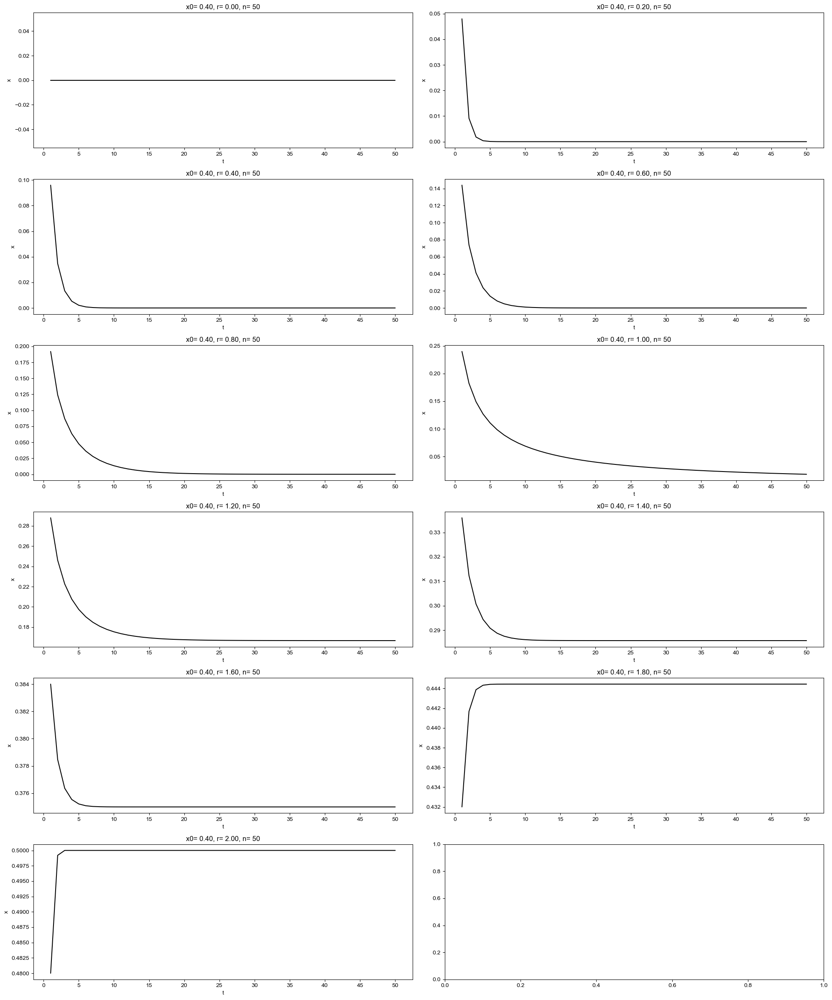

In [2]:
logistic_n_steps(x0=0.4, r=list(np.arange(0.0, 2.001, 0.2)), n=50, plot=True);

## Vary r from 2 to 4. What happens?

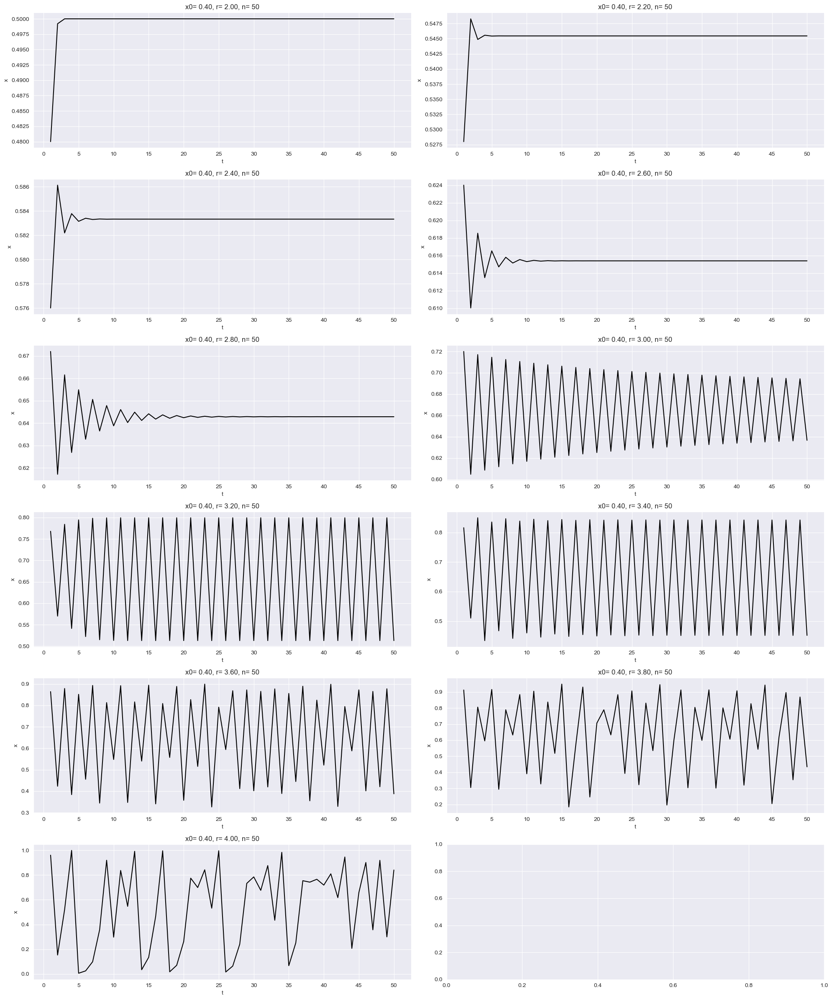

In [3]:
logistic_n_steps(x0=0.4, r=list(np.arange(2.0, 4.001, 0.2)), n=50, plot=True);

## Plot the bifurcation diagram

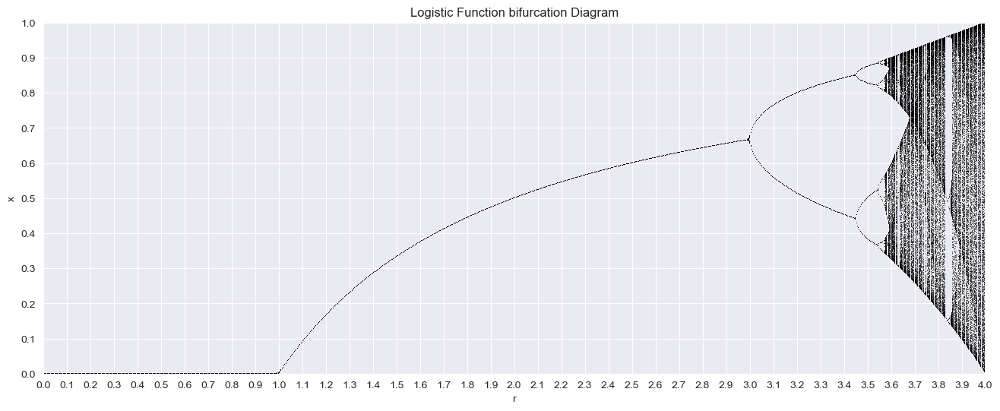

In [4]:
plot_logistic_bifurcation(0.4, 1000, 300)

# Part 2: Lorenz Attractor

## At the parameter values σ = 10, β = 8/3, and ρ = 28. What does the attractor look like?

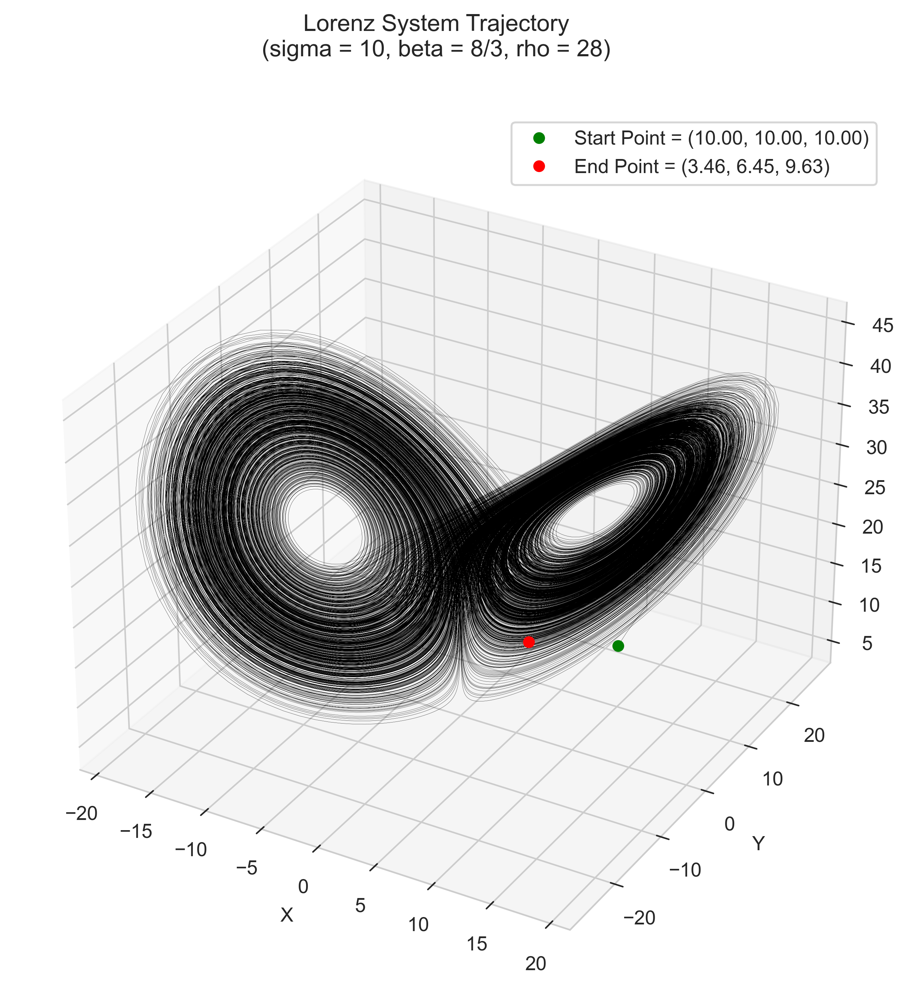

In [4]:
sns.set_style("whitegrid", {'axes.grid' : False})

fig = plt.figure(figsize=(8,8), dpi=400)
plt.suptitle("Lorenz System Trajectory\n(sigma = 10, beta = 8/3, rho = 28)")
fig.subplots_adjust(top=0.9)
solve_lorenz(ax=fig.add_subplot(1, 1, 1, projection='3d'));

## Test the theory that perturbations in the initial condition will grow larger at an exponential rate by plotting another trajectory

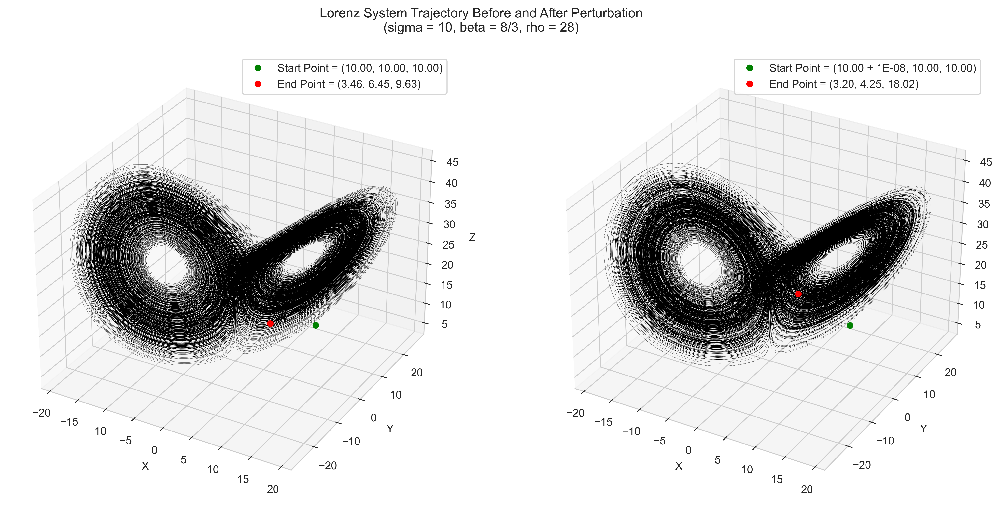

In [5]:
fig = plt.figure(figsize=(16,8), dpi=400)
fig.suptitle("Lorenz System Trajectory Before and After Perturbation\n(sigma = 10, beta = 8/3, rho = 28)")
fig.subplots_adjust(top=1.0)
xs, ys, zs, ts = solve_lorenz(ax=fig.add_subplot(1, 2, 1, projection='3d'))
xs_p, ys_p, zs_p, _ =solve_lorenz(x_perturb=1e-8, ax=fig.add_subplot(1, 2, 2, projection='3d'))

## At what time is the difference between the points on the trajectory larger than 1?

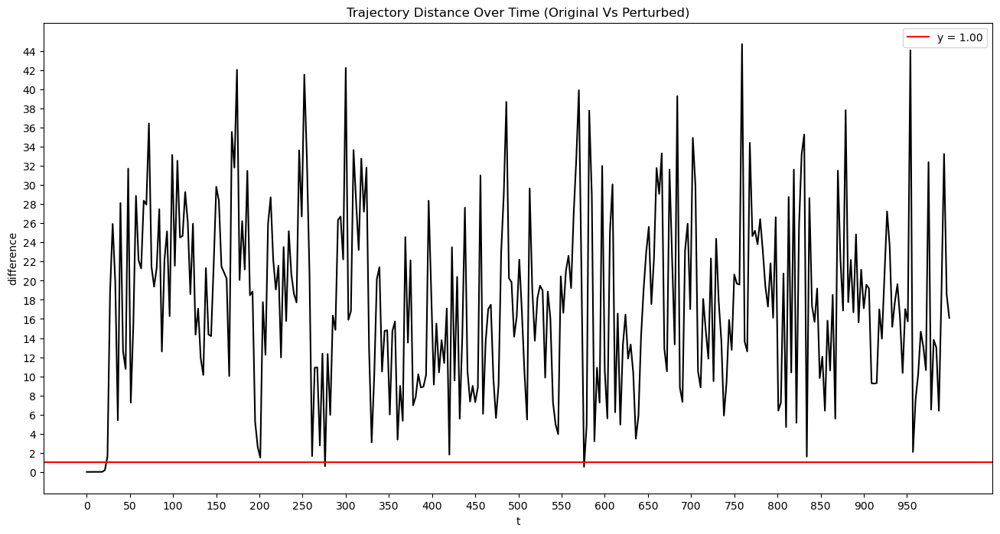

In [2]:
xs, ys, zs, ts = solve_lorenz(t=np.arange(0.0, 1000, 3), plot=False)
xs_p, ys_p, zs_p, _ = solve_lorenz(t=np.arange(0.0, 1000, 3), x_perturb=1e-8, plot=False)

fig = plt.figure(figsize=(16,8))
ax=fig.add_subplot(1, 1, 1)
diff = plot_trajectory_diff(xs, ys, zs, xs_p, ys_p, zs_p, ts,ax=ax, title="Trajectory Distance Over Time (Original Vs Perturbed)", horizontal=1.0);
ax.yaxis.set_ticks(np.arange(0, diff.max(), 2.0));
ax.xaxis.set_ticks(np.arange(0, ts.max(), 50.0));


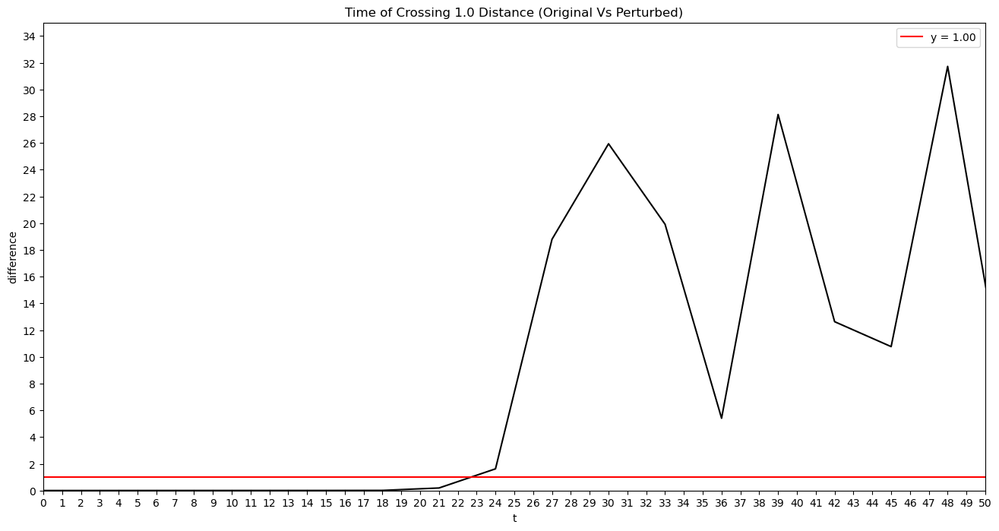

In [3]:
fig = plt.figure(figsize=(16,8))
ax=fig.add_subplot(1, 1, 1)
diff = plot_trajectory_diff(xs, ys, zs, xs_p, ys_p, zs_p, ts,ax=ax, title="Time of Crossing 1.0 Distance (Original Vs Perturbed)", horizontal=1.0);
ax.xaxis.set_ticks(np.arange(0, ts.max(), 1.0));
ax.yaxis.set_ticks(np.arange(0, diff.max(), 2.0));
ax.set_xlim(0, 50);
ax.set_ylim(0, 35);

## Change the parameter ρ to the value 0.5 and again compute and plot the two trajectories. What is the difference in terms of the sensitivity to the initial conditions?

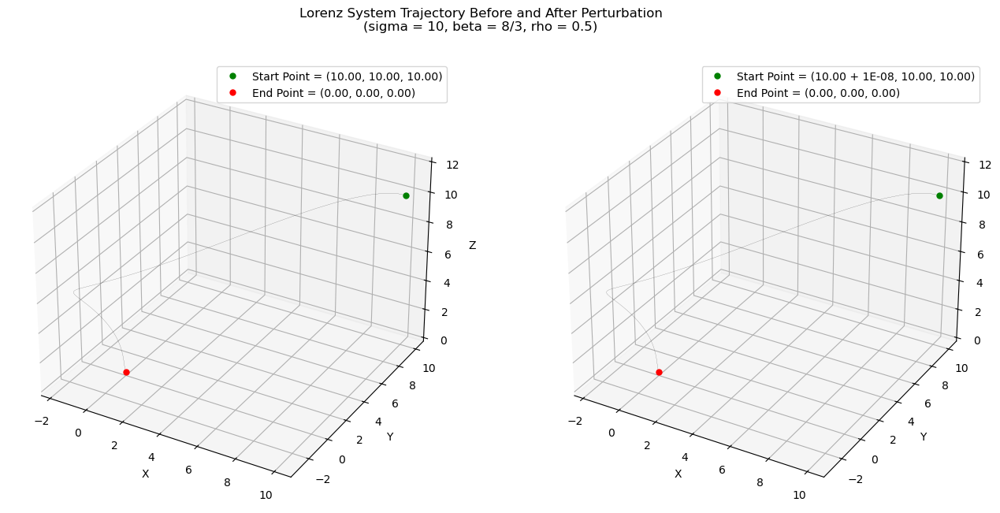

In [4]:
fig = plt.figure(figsize=(16,10))
fig.suptitle("Lorenz System Trajectory Before and After Perturbation\n(sigma = 10, beta = 8/3, rho = 0.5)")
fig.subplots_adjust(top=1.15)
solve_lorenz(rho=0.5, ax=fig.add_subplot(1, 2, 1, projection='3d'));
solve_lorenz(x_perturb=1e-8, rho=0.5, ax=fig.add_subplot(1, 2, 2, projection='3d'));

## Is there a bifurcation (or multiple ones) between the value 0.5 and 28? Why, or why not

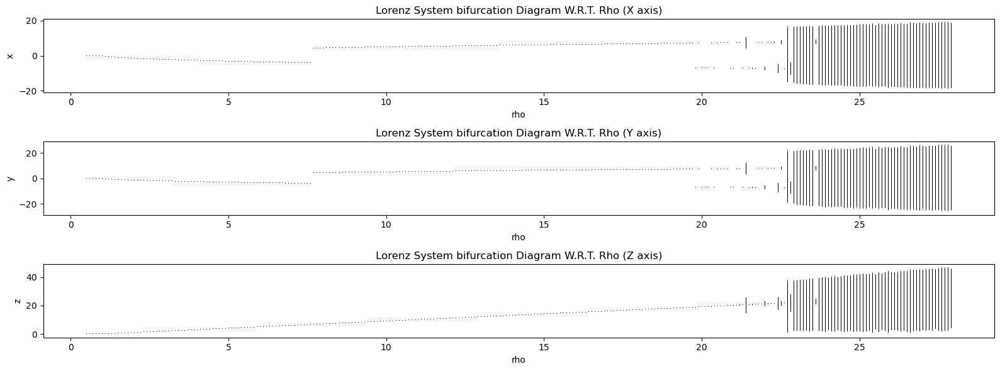

In [3]:
plot_lorenz_bifurcation_rho(rho =np.arange(0.5, 28, 0.1));